In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install tf_explain

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.4 MB/s eta 0:00:00


In [3]:
import os
import glob
import numpy as np
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import Layer, Input, Conv2D, BatchNormalization, ReLU, AveragePooling2D, UpSampling2D, Concatenate
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import ModelCheckpoint, Callback
import matplotlib.pyplot as plt
from tf_explain.core.grad_cam import GradCAM

In [4]:
# Helper function to load a single image
def load_image(path, IMAGE_SIZE=320):
    image = load_img(path)
    image = img_to_array(image)
    image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
    image = tf.cast(image, tf.float32)
    image = image / 255.
    return image

# Helper function to load multiple images
def load_images(paths, IMAGE_SIZE=320):
    images = np.zeros((len(paths), IMAGE_SIZE, IMAGE_SIZE, 3))
    for i, path in tqdm(enumerate(paths), desc="Loading"):
        images[i] = load_image(path, IMAGE_SIZE=IMAGE_SIZE)
    return images

def load_data(root_path, IMAGE_SIZE=320, BATCH_SIZE=8, files=False, train_size=0.8):
    image_paths = glob.glob(os.path.join(root_path, "images", "*.png"))

    # Shuffle the image paths
    np.random.shuffle(image_paths)

    # Split the image paths
    train_split = int(len(image_paths) * train_size)
    train_image_paths = image_paths[:train_split]
    valid_image_paths = image_paths[train_split:]

    # Update mask paths
    train_mask_paths = [path.replace("images", "labels") for path in train_image_paths]
    valid_mask_paths = [path.replace("images", "labels") for path in valid_image_paths]

    # Load Data
    train_images = load_images(train_image_paths, IMAGE_SIZE=IMAGE_SIZE)
    train_masks = load_images(train_mask_paths, IMAGE_SIZE=IMAGE_SIZE)

    valid_images = load_images(valid_image_paths, IMAGE_SIZE=IMAGE_SIZE)
    valid_masks = load_images(valid_mask_paths, IMAGE_SIZE=IMAGE_SIZE)

    train_data = tf.data.Dataset.from_tensor_slices((train_images, train_masks))
    train_data = train_data.batch(BATCH_SIZE, drop_remainder=True)
    train_data = train_data.shuffle(1000).prefetch(tf.data.AUTOTUNE)

    valid_data = tf.data.Dataset.from_tensor_slices((valid_images, valid_masks))
    valid_data = valid_data.batch(BATCH_SIZE, drop_remainder=True)
    valid_data = valid_data.prefetch(tf.data.AUTOTUNE)

    if files:
        return train_data, valid_data, train_images, train_masks, valid_images, valid_masks

    return train_data, valid_data


In [5]:
# Load Data
train_ds, valid_ds, train_images, train_masks, val_images, val_masks = load_data(
    root_path="/content/drive/MyDrive/glof/train",
    IMAGE_SIZE=128,
    BATCH_SIZE=8,
    files=True
)


Loading: 800it [00:28, 28.17it/s] 
Loading: 800it [04:22,  3.04it/s]
Loading: 200it [00:01, 113.59it/s]
Loading: 200it [01:06,  3.00it/s]


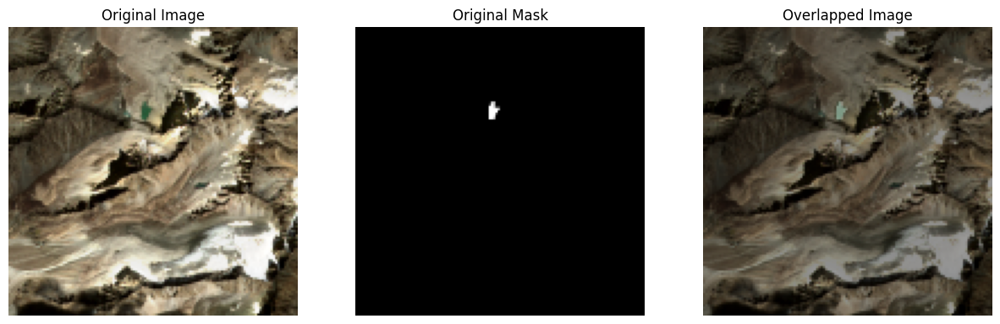

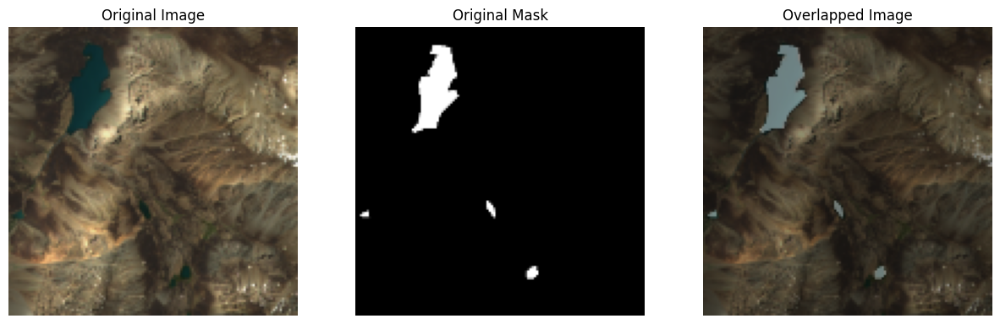

In [6]:
# Data Visualization function
def show_images(data, model=None, explain=False, n_images=6, SIZE=(25,10)):
    if model is not None:
        n_cols = 5 if explain else 4
    else:
        n_cols = 3

    for plot_no in range(1, n_images + 1):
        for index, (images, masks) in enumerate(iter(data)):
            id = np.random.randint(len(images))
            image, mask = images[id], masks[id]

            if model is not None:
                pred_mask = model.predict(image[np.newaxis, ...])[0]

                if explain:
                    cam = GradCAM()
                    cam = cam.explain(
                        validation_data=(val_images[id][np.newaxis, ...], val_masks[id]),
                        model=model,
                        class_index=1,
                        layer_name="Top-ConvBlock-2",
                        image_weight=0.5
                    )

                    plt.figure(figsize=SIZE)
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask)
                    plt.axis('off')
                    plt.title('Original Mask')
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask)
                    plt.axis('off')
                    plt.title("Predicted Mask")
                    plt.subplot(1, n_cols, 4)
                    plt.imshow(image)
                    plt.imshow(pred_mask, alpha=0.4)
                    plt.axis('off')
                    plt.title("Overlapped Prediction")
                    plt.subplot(1, n_cols, 5)
                    plt.imshow(cam)
                    plt.axis('off')
                    plt.title("Grad CAM")
                    plt.show()
                else:
                    plt.figure(figsize=SIZE)
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask)
                    plt.axis('off')
                    plt.title('Original Mask')
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask)
                    plt.axis('off')
                    plt.title("Predicted Mask")
                    plt.subplot(1, n_cols, 4)
                    plt.imshow(image)
                    plt.imshow(pred_mask, alpha=0.4)
                    plt.axis('off')
                    plt.title("Overlapped Prediction")
                    plt.show()
            else:
                plt.figure(figsize=SIZE)
                plt.subplot(1, n_cols, 1)
                plt.imshow(image)
                plt.axis('off')
                plt.title("Original Image")
                plt.subplot(1, n_cols, 2)
                plt.imshow(mask)
                plt.axis('off')
                plt.title('Original Mask')
                plt.subplot(1, n_cols, 3)
                plt.imshow(image)
                plt.imshow(mask, alpha=0.4)
                plt.axis('off')
                plt.title("Overlapped Image")
                plt.show()

            break

show_images(data=train_ds, n_images=1, SIZE=(15, 5))
show_images(data=valid_ds, n_images=1, SIZE=(15, 8))


In [7]:
class ConvBlock(Layer):
    def __init__(self, filters=256, kernel_size=3, dilation_rate=1, **kwargs):
        super(ConvBlock, self).__init__(**kwargs)
        self.filters = filters
        self.kernel_size = kernel_size
        self.dilation_rate = dilation_rate
        self.net = Sequential([
            Conv2D(filters, kernel_size=kernel_size, padding='same', dilation_rate=dilation_rate, use_bias=False, kernel_initializer='he_normal'),
            BatchNormalization(),
            ReLU()
        ])

    def call(self, X):
        return self.net(X)

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "filters": self.filters, "kernel_size": self.kernel_size, "dilation_rate": self.dilation_rate}

def AtrousSpatialPyramidPooling(X):
    B, H, W, C = X.shape
    image_pool = AveragePooling2D(pool_size=(H, W), name="ASPP-AvgPool")(X)
    image_pool = ConvBlock(kernel_size=1, name="ASPP-ImagePool-CB")(image_pool)
    image_pool = UpSampling2D(size=(H // image_pool.shape[1], W // image_pool.shape[2]), name="ASPP-ImagePool-UpSample")(image_pool)
    conv_1 = ConvBlock(kernel_size=1, dilation_rate=1, name="ASPP-CB-1")(X)
    conv_6 = ConvBlock(kernel_size=3, dilation_rate=6, name="ASPP-CB-6")(X)
    conv_12 = ConvBlock(kernel_size=3, dilation_rate=12, name="ASPP-CB-12")(X)
    conv_18 = ConvBlock(kernel_size=3, dilation_rate=18, name="ASPP-CB-18")(X)
    combined = Concatenate(name="ASPP-Combine")([image_pool, conv_1, conv_6, conv_12, conv_18])
    processed = ConvBlock(kernel_size=1, name="ASPP-Net")(combined)
    return processed


In [8]:
LR = 1e-3
IMAGE_SIZE = 128
InputL = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")
resnet50 = ResNet50(include_top=False, weights='imagenet', input_tensor=InputL)
DCNN = resnet50.get_layer('conv4_block6_2_relu').output
ASPP = AtrousSpatialPyramidPooling(DCNN)
ASPP = UpSampling2D(size=(IMAGE_SIZE // 4 // ASPP.shape[1], IMAGE_SIZE // 4 // ASPP.shape[2]), name="AtrousSpatial")(ASPP)
LLF = resnet50.get_layer('conv2_block3_2_relu').output
LLF = ConvBlock(filters=48, kernel_size=1, name="LLF-ConvBlock")(LLF)
combined = Concatenate(axis=-1, name="Combine-LLF-ASPP")([ASPP, LLF])
features = ConvBlock(name="Top-ConvBlock-1")(combined)
features = ConvBlock(name="Top-ConvBlock-2")(features)
upsample = UpSampling2D(size=(IMAGE_SIZE // features.shape[1], IMAGE_SIZE // features.shape[1]), interpolation='bilinear', name="Top-UpSample")(features)
PredMask = Conv2D(3, kernel_size=3, strides=1, padding='same', activation='sigmoid', use_bias=False, name="OutputMask")(upsample)
model = Model(InputL, PredMask, name="DeepLabV3-Plus")
model.summary()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "DeepLabV3-Plus"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ InputLayer          │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 134, 134,  │          0 │ InputLayer[0][0]  │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 66, 66,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 32, 32,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 32, 32,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 32, 32,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 32, 32,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 32, 32,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 32, 32,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 32, 32,    │      1,024 │ conv2_block1_3_c

 Total params: 11,858,752 (45.24 MB)

 Trainable params: 11,826,016 (45.11 MB)

 Non-trainable params: 32,736 (127.88 KB)

In [9]:
import numpy as np
import tensorflow as tf

def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(tf.cast(y_true, tf.float32))
    y_pred_f = tf.keras.backend.flatten(tf.cast(y_pred, tf.float32))
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def iou(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(tf.cast(y_true, tf.float32))
    y_pred_f = tf.keras.backend.flatten(tf.cast(y_pred, tf.float32))
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def precision(y_true, y_pred):
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred_f = tf.cast(y_pred, tf.float32)
    true_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true_f * y_pred_f, 0, 1)))
    predicted_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_pred_f, 0, 1)))
    return true_positives / (predicted_positives + tf.keras.backend.epsilon())

def recall(y_true, y_pred):
    y_true_f = tf.cast(y_true, tf.float32)
    y_pred_f = tf.cast(y_pred, tf.float32)
    true_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true_f * y_pred_f, 0, 1)))
    possible_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true_f, 0, 1)))
    return true_positives / (possible_positives + tf.keras.backend.epsilon())

def f1_score(y_true, y_pred):
    prec = precision(y_true, y_pred)
    rec = recall(y_true, y_pred)
    return 2 * ((prec * rec) / (prec + rec + tf.keras.backend.epsilon()))

# Assuming LR is defined somewhere in your code
optimizer = tf.keras.optimizers.Adam(learning_rate=LR)
model.compile(loss=dice_loss, optimizer=optimizer, metrics=['accuracy', dice_coefficient, iou, precision, recall, f1_score])


Epoch 1/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.4273 - dice_coefficient: 0.4243 - f1_score: 0.4513 - iou: 0.3096 - loss: 0.5757 - precision: 0.4484 - recall: 0.6724

100/100 ━━━━━━━━━━━━━━━━━━━━ 78s 153ms/step - accuracy: 0.4264 - dice_coefficient: 0.4258 - f1_score: 0.4527 - iou: 0.3108 - loss: 0.5742 - precision: 0.4500 - recall: 0.6726 - val_accuracy: 1.0000 - val_dice_coefficient: 2.8961e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.8961e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.5242 - dice_coefficient: 0.7424 - f1_score: 0.7443 - iou: 0.6052 - loss: 0.2576 - precision: 0.7456 - recall: 0.7955

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - accuracy: 0.5245 - dice_coefficient: 0.7425 - f1_score: 0.7444 - iou: 0.6054 - loss: 0.2575 - precision: 0.7458 - recall: 0.7955 - val_accuracy: 0.0562 - val_dice_coefficient: 3.3150e-04 - val_f1_score: 0.0000e+00 - val_iou: 3.1020e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.4639 - dice_coefficient: 0.8001 - f1_score: 0.8028 - iou: 0.6806 - loss: 0.1999 - precision: 0.8073 - recall: 0.8289

100/100 ━━━━━━━━━━━━━━━━━━━━ 21s 108ms/step - accuracy: 0.4638 - dice_coefficient: 0.8000 - f1_score: 0.8027 - iou: 0.6805 - loss: 0.2000 - precision: 0.8071 - recall: 0.8289 - val_accuracy: 0.9770 - val_dice_coefficient: 3.0914e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.9917e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.4433 - dice_coefficient: 0.7414 - f1_score: 0.7432 - iou: 0.6094 - loss: 0.2586 - precision: 0.7745 - recall: 0.7679

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - accuracy: 0.4432 - dice_coefficient: 0.7416 - f1_score: 0.7434 - iou: 0.6096 - loss: 0.2584 - precision: 0.7744 - recall: 0.7682 - val_accuracy: 0.1416 - val_dice_coefficient: 2.8972e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.8966e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.4040 - dice_coefficient: 0.8091 - f1_score: 0.8111 - iou: 0.6922 - loss: 0.1909 - precision: 0.8086 - recall: 0.8377

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['InputLayer']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


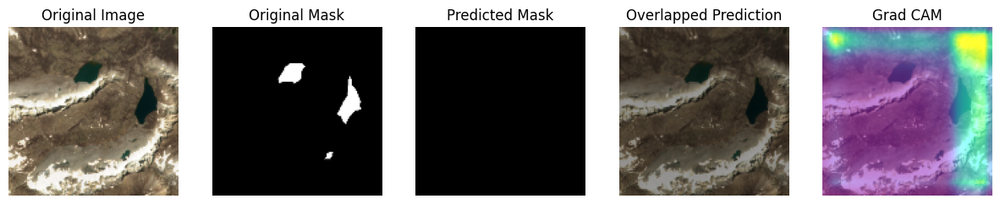

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


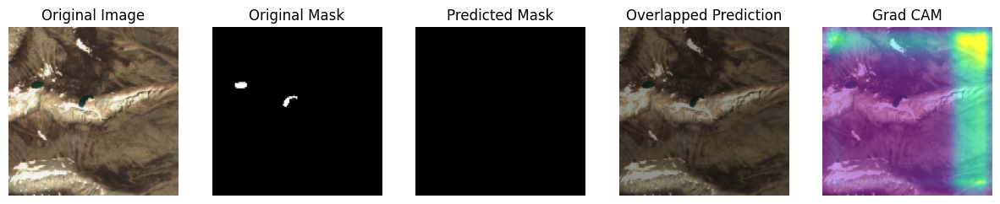

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


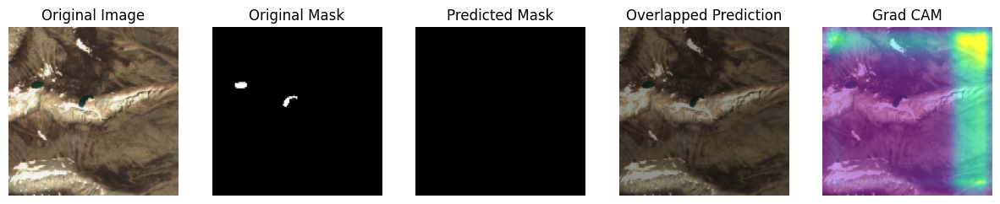

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


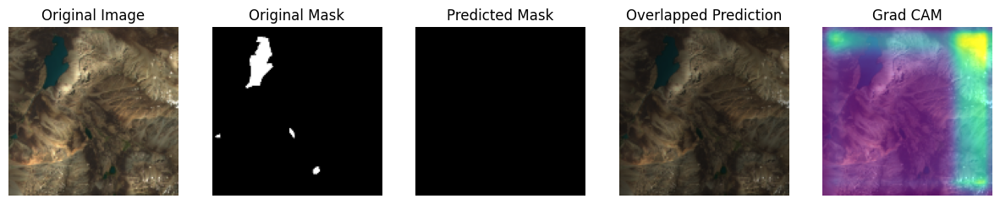

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


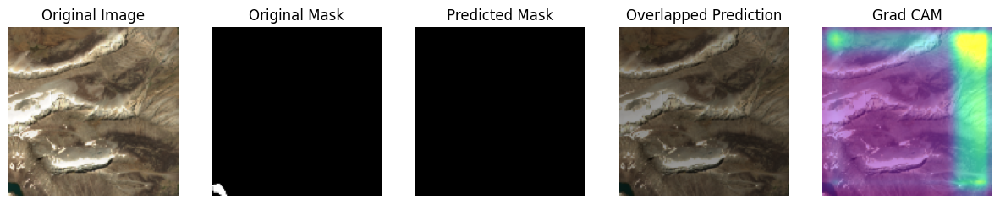

100/100 ━━━━━━━━━━━━━━━━━━━━ 28s 282ms/step - accuracy: 0.4041 - dice_coefficient: 0.8092 - f1_score: 0.8113 - iou: 0.6923 - loss: 0.1908 - precision: 0.8088 - recall: 0.8378 - val_accuracy: 0.9812 - val_dice_coefficient: 2.8974e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.8968e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 6/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.4467 - dice_coefficient: 0.8249 - f1_score: 0.8264 - iou: 0.7132 - loss: 0.1751 - precision: 0.8324 - recall: 0.8415

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - accuracy: 0.4466 - dice_coefficient: 0.8249 - f1_score: 0.8264 - iou: 0.7133 - loss: 0.1751 - precision: 0.8324 - recall: 0.8416 - val_accuracy: 0.1871 - val_dice_coefficient: 2.9002e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.8981e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 7/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5041 - dice_coefficient: 0.8369 - f1_score: 0.8390 - iou: 0.7332 - loss: 0.1631 - precision: 0.8332 - recall: 0.8679

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - accuracy: 0.5042 - dice_coefficient: 0.8368 - f1_score: 0.8389 - iou: 0.7330 - loss: 0.1632 - precision: 0.8332 - recall: 0.8678 - val_accuracy: 0.8489 - val_dice_coefficient: 2.9217e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.9086e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 8/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.4780 - dice_coefficient: 0.8378 - f1_score: 0.8397 - iou: 0.7316 - loss: 0.1622 - precision: 0.8379 - recall: 0.8595

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - accuracy: 0.4781 - dice_coefficient: 0.8378 - f1_score: 0.8397 - iou: 0.7316 - loss: 0.1622 - precision: 0.8378 - recall: 0.8595 - val_accuracy: 0.2454 - val_dice_coefficient: 2.9475e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.9213e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 9/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.4169 - dice_coefficient: 0.8565 - f1_score: 0.8589 - iou: 0.7569 - loss: 0.1435 - precision: 0.8551 - recall: 0.8746

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - accuracy: 0.4171 - dice_coefficient: 0.8564 - f1_score: 0.8588 - iou: 0.7568 - loss: 0.1436 - precision: 0.8550 - recall: 0.8746 - val_accuracy: 0.1951 - val_dice_coefficient: 2.9824e-04 - val_f1_score: 0.0000e+00 - val_iou: 2.9391e-04 - val_loss: 0.9997 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 10/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5197 - dice_coefficient: 0.8605 - f1_score: 0.8626 - iou: 0.7619 - loss: 0.1395 - precision: 0.8663 - recall: 0.8702

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


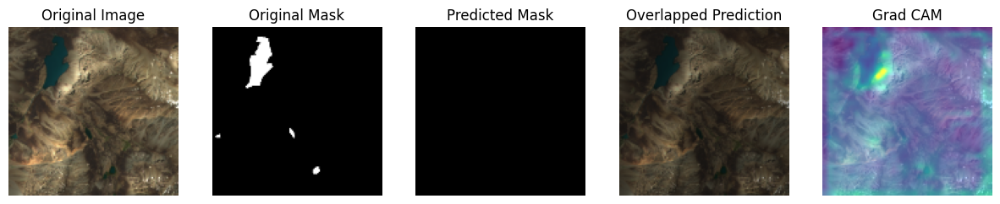

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


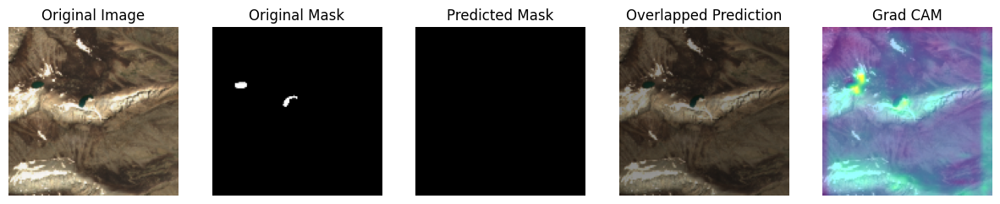

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


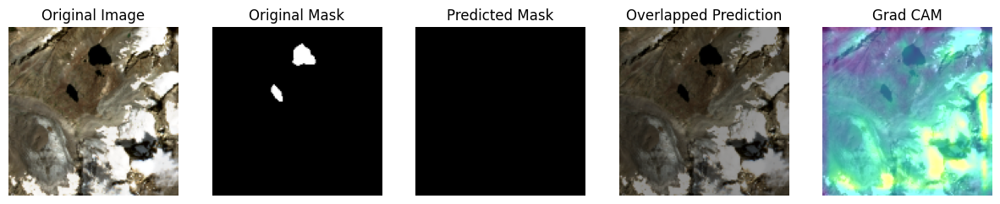

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


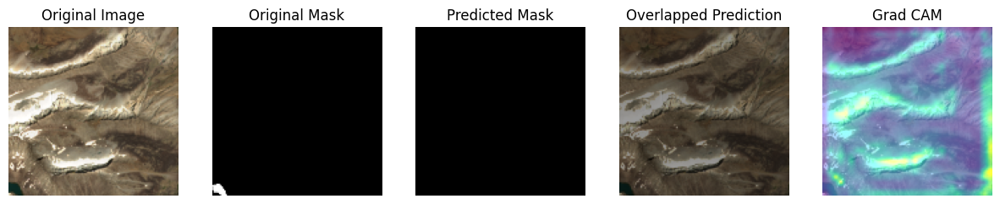

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


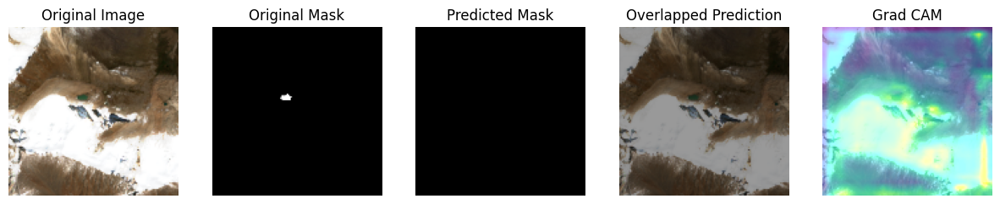

100/100 ━━━━━━━━━━━━━━━━━━━━ 18s 182ms/step - accuracy: 0.5199 - dice_coefficient: 0.8603 - f1_score: 0.8625 - iou: 0.7617 - loss: 0.1397 - precision: 0.8662 - recall: 0.8701 - val_accuracy: 0.9981 - val_dice_coefficient: 0.0269 - val_f1_score: 0.0257 - val_iou: 0.0150 - val_loss: 0.9731 - val_precision: 0.2800 - val_recall: 0.0143
Epoch 11/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5505 - dice_coefficient: 0.8530 - f1_score: 0.8549 - iou: 0.7585 - loss: 0.1470 - precision: 0.8448 - recall: 0.8849

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - accuracy: 0.5504 - dice_coefficient: 0.8529 - f1_score: 0.8548 - iou: 0.7583 - loss: 0.1471 - precision: 0.8449 - recall: 0.8848 - val_accuracy: 0.4258 - val_dice_coefficient: 0.1589 - val_f1_score: 0.1577 - val_iou: 0.1006 - val_loss: 0.8411 - val_precision: 0.6305 - val_recall: 0.1051
Epoch 12/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5516 - dice_coefficient: 0.8708 - f1_score: 0.8728 - iou: 0.7768 - loss: 0.1292 - precision: 0.8713 - recall: 0.8834

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - accuracy: 0.5516 - dice_coefficient: 0.8708 - f1_score: 0.8728 - iou: 0.7768 - loss: 0.1292 - precision: 0.8713 - recall: 0.8834 - val_accuracy: 0.4469 - val_dice_coefficient: 0.5344 - val_f1_score: 0.5342 - val_iou: 0.3799 - val_loss: 0.4656 - val_precision: 0.9639 - val_recall: 0.3864
Epoch 13/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.5500 - dice_coefficient: 0.8603 - f1_score: 0.8622 - iou: 0.7735 - loss: 0.1397 - precision: 0.8512 - recall: 0.9014

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - accuracy: 0.5498 - dice_coefficient: 0.8605 - f1_score: 0.8624 - iou: 0.7736 - loss: 0.1395 - precision: 0.8514 - recall: 0.9013 - val_accuracy: 0.3803 - val_dice_coefficient: 0.5846 - val_f1_score: 0.5847 - val_iou: 0.4338 - val_loss: 0.4154 - val_precision: 0.8853 - val_recall: 0.4575
Epoch 14/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.4789 - dice_coefficient: 0.8581 - f1_score: 0.8603 - iou: 0.7612 - loss: 0.1419 - precision: 0.8563 - recall: 0.8793

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - accuracy: 0.4787 - dice_coefficient: 0.8581 - f1_score: 0.8603 - iou: 0.7611 - loss: 0.1419 - precision: 0.8564 - recall: 0.8792 - val_accuracy: 0.3529 - val_dice_coefficient: 0.6373 - val_f1_score: 0.6377 - val_iou: 0.4846 - val_loss: 0.3627 - val_precision: 0.8734 - val_recall: 0.5206
Epoch 15/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.5272 - dice_coefficient: 0.8408 - f1_score: 0.8423 - iou: 0.7325 - loss: 0.1592 - precision: 0.8457 - recall: 0.8518

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


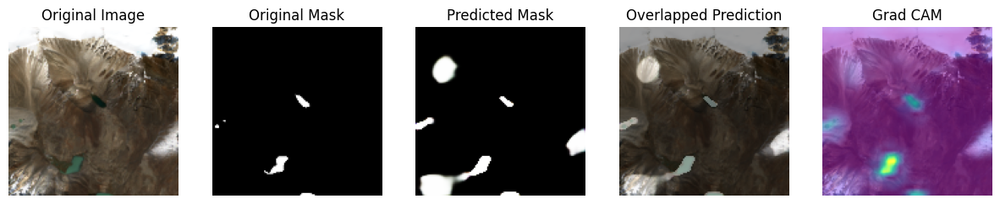

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


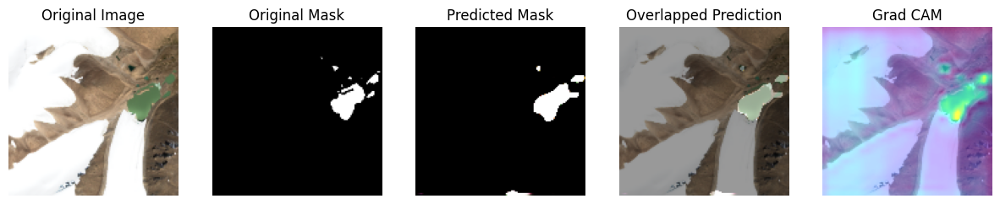

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


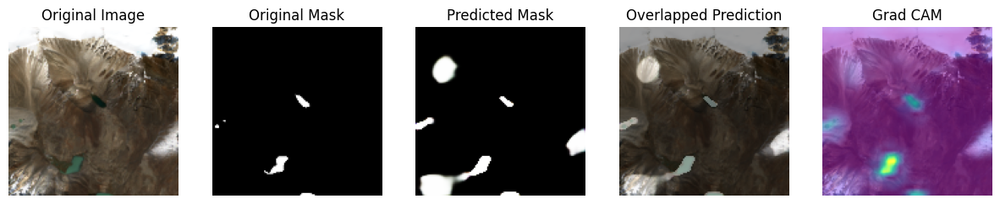

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


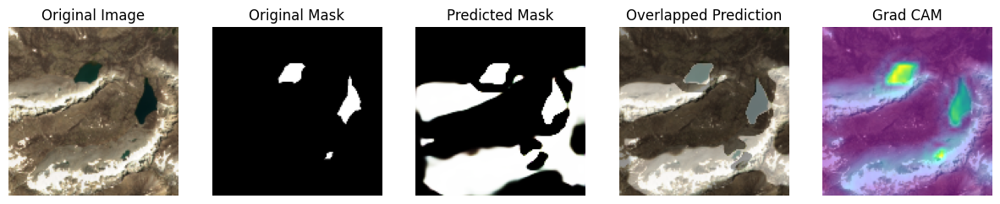

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


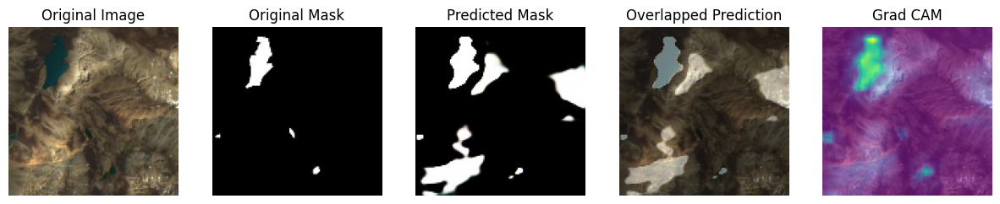

100/100 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - accuracy: 0.5273 - dice_coefficient: 0.8406 - f1_score: 0.8422 - iou: 0.7323 - loss: 0.1594 - precision: 0.8455 - recall: 0.8518 - val_accuracy: 0.4587 - val_dice_coefficient: 0.0796 - val_f1_score: 0.0796 - val_iou: 0.0421 - val_loss: 0.9204 - val_precision: 0.0423 - val_recall: 0.8991
Epoch 16/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.5457 - dice_coefficient: 0.8275 - f1_score: 0.8294 - iou: 0.7160 - loss: 0.1725 - precision: 0.8454 - recall: 0.8317

100/100 ━━━━━━━━━━━━━━━━━━━━ 16s 117ms/step - accuracy: 0.5453 - dice_coefficient: 0.8275 - f1_score: 0.8293 - iou: 0.7159 - loss: 0.1725 - precision: 0.8453 - recall: 0.8317 - val_accuracy: 0.4377 - val_dice_coefficient: 0.7404 - val_f1_score: 0.7418 - val_iou: 0.6007 - val_loss: 0.2596 - val_precision: 0.7449 - val_recall: 0.7633
Epoch 17/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.3498 - dice_coefficient: 0.8428 - f1_score: 0.8450 - iou: 0.7411 - loss: 0.1572 - precision: 0.8430 - recall: 0.8682

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - accuracy: 0.3498 - dice_coefficient: 0.8428 - f1_score: 0.8450 - iou: 0.7411 - loss: 0.1572 - precision: 0.8430 - recall: 0.8681 - val_accuracy: 0.3420 - val_dice_coefficient: 0.7519 - val_f1_score: 0.7526 - val_iou: 0.6158 - val_loss: 0.2481 - val_precision: 0.9096 - val_recall: 0.6514
Epoch 18/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.2464 - dice_coefficient: 0.8402 - f1_score: 0.8430 - iou: 0.7391 - loss: 0.1598 - precision: 0.8477 - recall: 0.8590

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - accuracy: 0.2468 - dice_coefficient: 0.8403 - f1_score: 0.8431 - iou: 0.7392 - loss: 0.1597 - precision: 0.8478 - recall: 0.8590 - val_accuracy: 0.2640 - val_dice_coefficient: 0.7594 - val_f1_score: 0.7612 - val_iou: 0.6296 - val_loss: 0.2406 - val_precision: 0.8956 - val_recall: 0.6783
Epoch 19/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.3331 - dice_coefficient: 0.8823 - f1_score: 0.8843 - iou: 0.7956 - loss: 0.1177 - precision: 0.8848 - recall: 0.8916

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - accuracy: 0.3336 - dice_coefficient: 0.8821 - f1_score: 0.8841 - iou: 0.7954 - loss: 0.1179 - precision: 0.8846 - recall: 0.8915 - val_accuracy: 0.3603 - val_dice_coefficient: 0.8411 - val_f1_score: 0.8426 - val_iou: 0.7347 - val_loss: 0.1589 - val_precision: 0.8657 - val_recall: 0.8261
Epoch 20/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.4782 - dice_coefficient: 0.8847 - f1_score: 0.8872 - iou: 0.7978 - loss: 0.1153 - precision: 0.8872 - recall: 0.8938

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


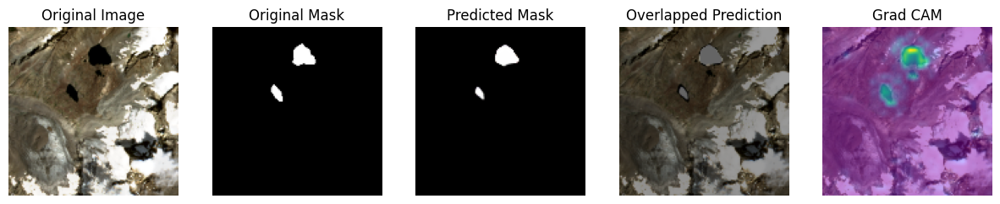

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


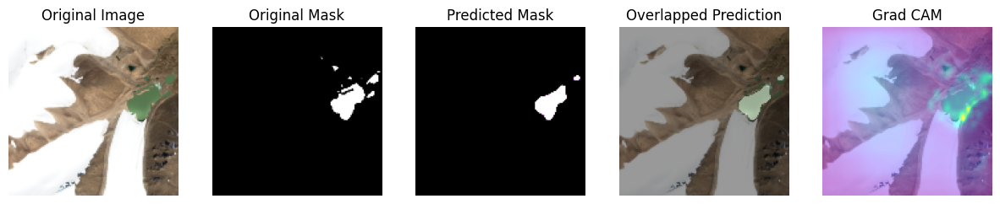

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


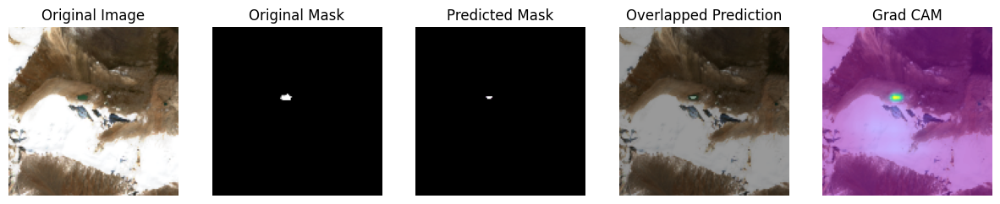

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


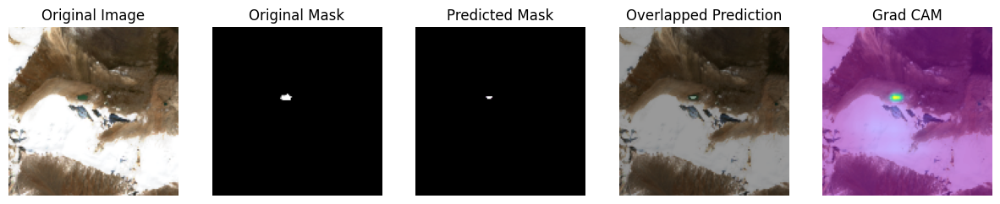

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


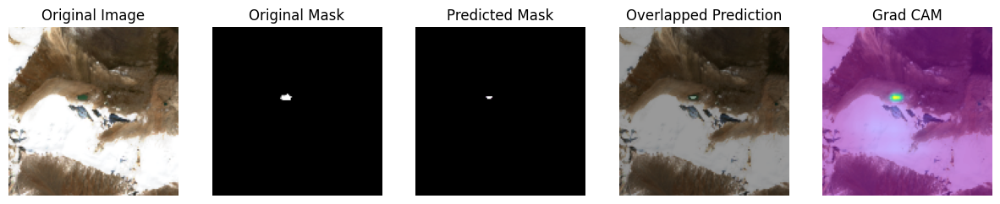

100/100 ━━━━━━━━━━━━━━━━━━━━ 17s 173ms/step - accuracy: 0.4781 - dice_coefficient: 0.8847 - f1_score: 0.8872 - iou: 0.7977 - loss: 0.1153 - precision: 0.8872 - recall: 0.8938 - val_accuracy: 0.4380 - val_dice_coefficient: 0.8288 - val_f1_score: 0.8303 - val_iou: 0.7163 - val_loss: 0.1712 - val_precision: 0.8959 - val_recall: 0.7764
Epoch 21/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.4490 - dice_coefficient: 0.8808 - f1_score: 0.8832 - iou: 0.7948 - loss: 0.1192 - precision: 0.8737 - recall: 0.9049

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - accuracy: 0.4489 - dice_coefficient: 0.8809 - f1_score: 0.8833 - iou: 0.7949 - loss: 0.1191 - precision: 0.8739 - recall: 0.9048 - val_accuracy: 0.3508 - val_dice_coefficient: 0.2520 - val_f1_score: 0.2556 - val_iou: 0.1519 - val_loss: 0.7480 - val_precision: 0.1662 - val_recall: 0.7598
Epoch 22/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.3901 - dice_coefficient: 0.8041 - f1_score: 0.8065 - iou: 0.6819 - loss: 0.1959 - precision: 0.8354 - recall: 0.8083

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step - accuracy: 0.3900 - dice_coefficient: 0.8042 - f1_score: 0.8065 - iou: 0.6820 - loss: 0.1958 - precision: 0.8353 - recall: 0.8084 - val_accuracy: 0.7224 - val_dice_coefficient: 0.7996 - val_f1_score: 0.8016 - val_iou: 0.6760 - val_loss: 0.2004 - val_precision: 0.8835 - val_recall: 0.7388
Epoch 23/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.4887 - dice_coefficient: 0.8651 - f1_score: 0.8672 - iou: 0.7687 - loss: 0.1349 - precision: 0.8648 - recall: 0.8793

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - accuracy: 0.4888 - dice_coefficient: 0.8650 - f1_score: 0.8671 - iou: 0.7687 - loss: 0.1350 - precision: 0.8647 - recall: 0.8793 - val_accuracy: 0.3420 - val_dice_coefficient: 0.8275 - val_f1_score: 0.8289 - val_iou: 0.7113 - val_loss: 0.1725 - val_precision: 0.8713 - val_recall: 0.7940
Epoch 24/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5218 - dice_coefficient: 0.8613 - f1_score: 0.8635 - iou: 0.7674 - loss: 0.1387 - precision: 0.8634 - recall: 0.8797

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - accuracy: 0.5219 - dice_coefficient: 0.8613 - f1_score: 0.8635 - iou: 0.7674 - loss: 0.1387 - precision: 0.8634 - recall: 0.8797 - val_accuracy: 0.6193 - val_dice_coefficient: 0.7973 - val_f1_score: 0.7996 - val_iou: 0.6752 - val_loss: 0.2027 - val_precision: 0.8016 - val_recall: 0.8084
Epoch 25/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5586 - dice_coefficient: 0.8730 - f1_score: 0.8755 - iou: 0.7787 - loss: 0.1270 - precision: 0.8786 - recall: 0.8788

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


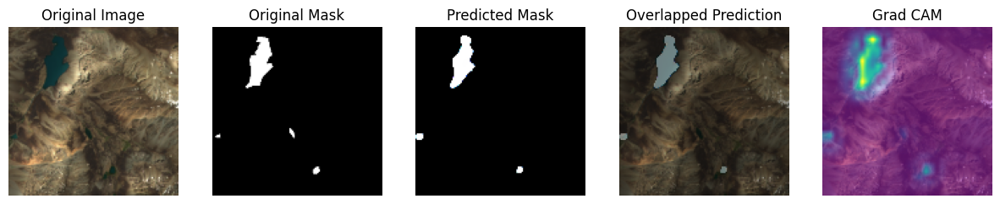

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


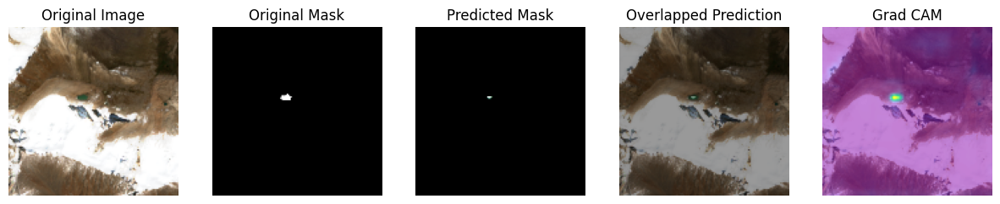

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


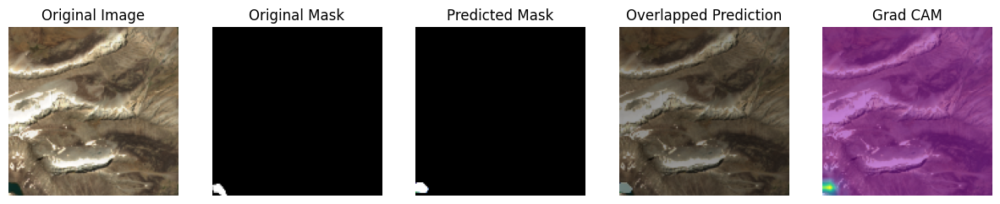

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


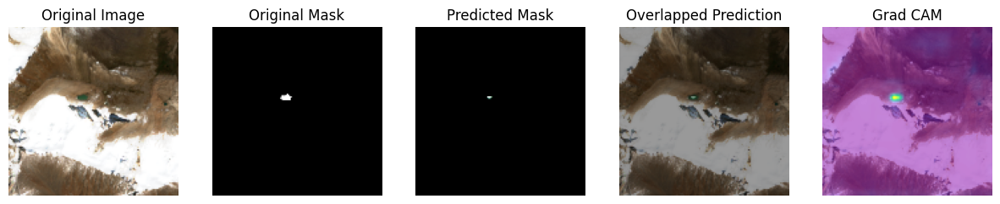

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


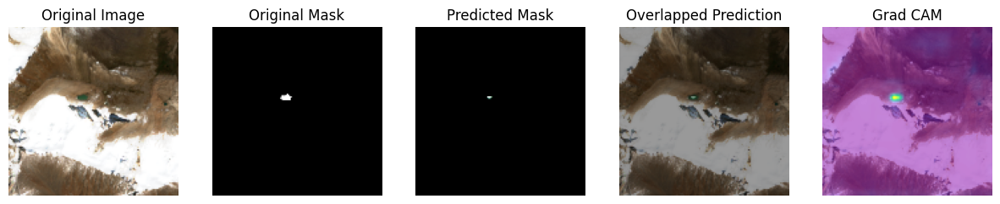

100/100 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.5589 - dice_coefficient: 0.8729 - f1_score: 0.8754 - iou: 0.7786 - loss: 0.1271 - precision: 0.8785 - recall: 0.8787 - val_accuracy: 0.3837 - val_dice_coefficient: 0.7304 - val_f1_score: 0.7311 - val_iou: 0.5818 - val_loss: 0.2696 - val_precision: 0.9000 - val_recall: 0.6232
Epoch 26/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.5263 - dice_coefficient: 0.8048 - f1_score: 0.8068 - iou: 0.6882 - loss: 0.1952 - precision: 0.8021 - recall: 0.8420

100/100 ━━━━━━━━━━━━━━━━━━━━ 32s 118ms/step - accuracy: 0.5260 - dice_coefficient: 0.8051 - f1_score: 0.8071 - iou: 0.6887 - loss: 0.1949 - precision: 0.8025 - recall: 0.8422 - val_accuracy: 0.7144 - val_dice_coefficient: 0.8200 - val_f1_score: 0.8289 - val_iou: 0.7060 - val_loss: 0.1800 - val_precision: 0.8691 - val_recall: 0.7966
Epoch 27/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.4433 - dice_coefficient: 0.8674 - f1_score: 0.8699 - iou: 0.7720 - loss: 0.1326 - precision: 0.8642 - recall: 0.8857

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - accuracy: 0.4431 - dice_coefficient: 0.8674 - f1_score: 0.8699 - iou: 0.7720 - loss: 0.1326 - precision: 0.8642 - recall: 0.8857 - val_accuracy: 0.6022 - val_dice_coefficient: 0.7431 - val_f1_score: 0.7447 - val_iou: 0.6069 - val_loss: 0.2569 - val_precision: 0.7559 - val_recall: 0.7600
Epoch 28/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.4412 - dice_coefficient: 0.8576 - f1_score: 0.8595 - iou: 0.7642 - loss: 0.1424 - precision: 0.8541 - recall: 0.8863

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - accuracy: 0.4416 - dice_coefficient: 0.8577 - f1_score: 0.8597 - iou: 0.7644 - loss: 0.1423 - precision: 0.8543 - recall: 0.8864 - val_accuracy: 0.5894 - val_dice_coefficient: 0.8370 - val_f1_score: 0.8385 - val_iou: 0.7282 - val_loss: 0.1630 - val_precision: 0.8578 - val_recall: 0.8228
Epoch 29/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.5206 - dice_coefficient: 0.8814 - f1_score: 0.8833 - iou: 0.7941 - loss: 0.1186 - precision: 0.8892 - recall: 0.8873

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - accuracy: 0.5211 - dice_coefficient: 0.8813 - f1_score: 0.8833 - iou: 0.7939 - loss: 0.1187 - precision: 0.8892 - recall: 0.8872 - val_accuracy: 0.9044 - val_dice_coefficient: 0.7862 - val_f1_score: 0.7881 - val_iou: 0.6581 - val_loss: 0.2138 - val_precision: 0.8594 - val_recall: 0.7354
Epoch 30/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.7675 - dice_coefficient: 0.8706 - f1_score: 0.8732 - iou: 0.7755 - loss: 0.1294 - precision: 0.8781 - recall: 0.8788

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


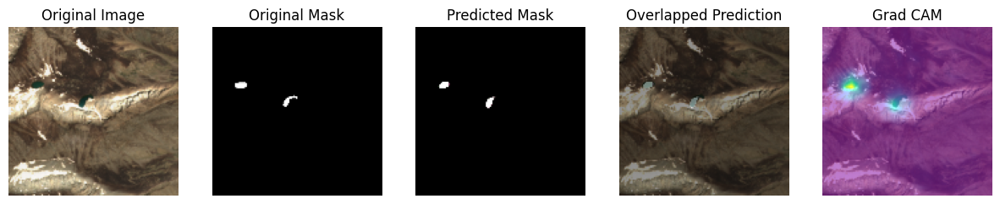

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


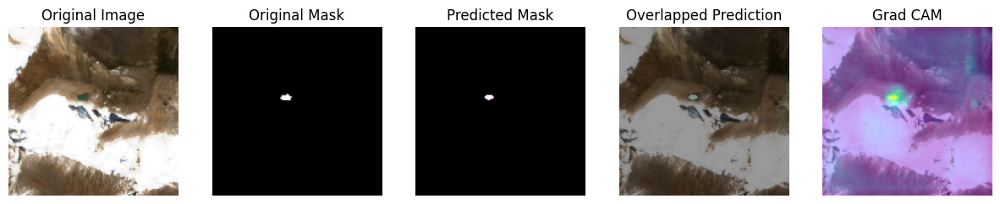

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


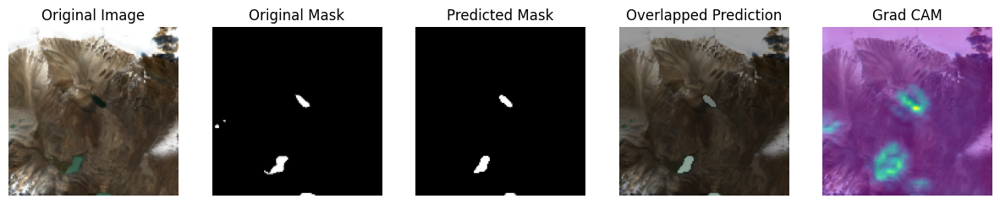

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


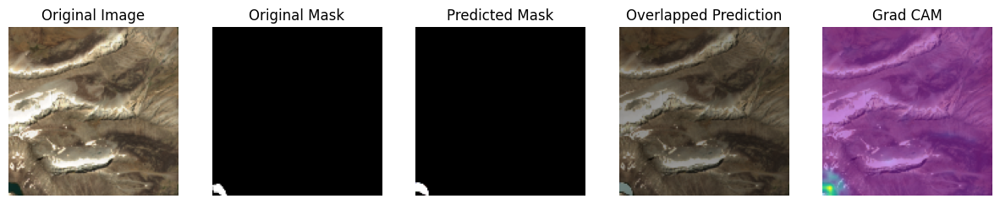

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


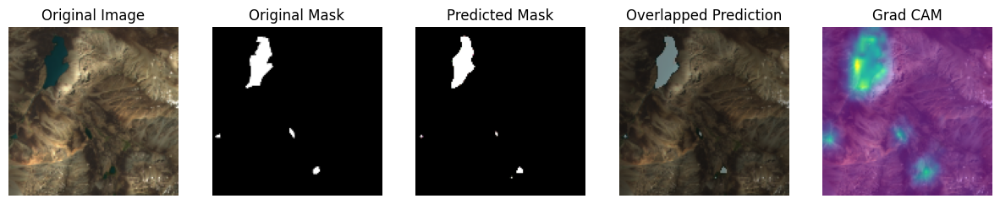

100/100 ━━━━━━━━━━━━━━━━━━━━ 26s 175ms/step - accuracy: 0.7669 - dice_coefficient: 0.8707 - f1_score: 0.8733 - iou: 0.7756 - loss: 0.1293 - precision: 0.8782 - recall: 0.8789 - val_accuracy: 0.8188 - val_dice_coefficient: 0.8263 - val_f1_score: 0.8282 - val_iou: 0.7149 - val_loss: 0.1737 - val_precision: 0.8934 - val_recall: 0.7767


In [10]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            show_images(valid_ds, model=self.model, explain=True, n_images=5, SIZE=(15, 8))

callbacks = [ModelCheckpoint("DeepLabV3-Plus.h5"), ShowProgress()]
history = model.fit(train_ds, validation_data=valid_ds, epochs=30, callbacks=callbacks)

In [11]:
import matplotlib.pyplot as plt

def print_evaluation_metrics(history):
    # Get the metrics from the history object
    metrics = history.history

    # Print the final values of the metrics
    print("Final Training Metrics:")
    print(f"Accuracy: {metrics['accuracy'][-1]:.4f}")
    print(f"Dice Coefficient: {metrics['dice_coefficient'][-1]:.4f}")
    print(f"IoU: {metrics['iou'][-1]:.4f}")
    print(f"Precision: {metrics['precision'][-1]:.4f}")
    print(f"Recall: {metrics['recall'][-1]:.4f}")
    print(f"F1 Score: {metrics['f1_score'][-1]:.4f}")

    print("\nFinal Validation Metrics:")
    print(f"Val Accuracy: {metrics['val_accuracy'][-1]:.4f}")
    print(f"Val Dice Coefficient: {metrics['val_dice_coefficient'][-1]:.4f}")
    print(f"Val IoU: {metrics['val_iou'][-1]:.4f}")
    print(f"Val Precision: {metrics['val_precision'][-1]:.4f}")
    print(f"Val Recall: {metrics['val_recall'][-1]:.4f}")
    print(f"Val F1 Score: {metrics['val_f1_score'][-1]:.4f}")

# Call the function to print the metrics
print_evaluation_metrics(history)


Final Training Metrics:
Accuracy: 0.7091
Dice Coefficient: 0.8807
IoU: 0.7911
Precision: 0.8830
Recall: 0.8902
F1 Score: 0.8830

Final Validation Metrics:
Val Accuracy: 0.8188
Val Dice Coefficient: 0.8263
Val IoU: 0.7149
Val Precision: 0.8934
Val Recall: 0.7767
Val F1 Score: 0.8282


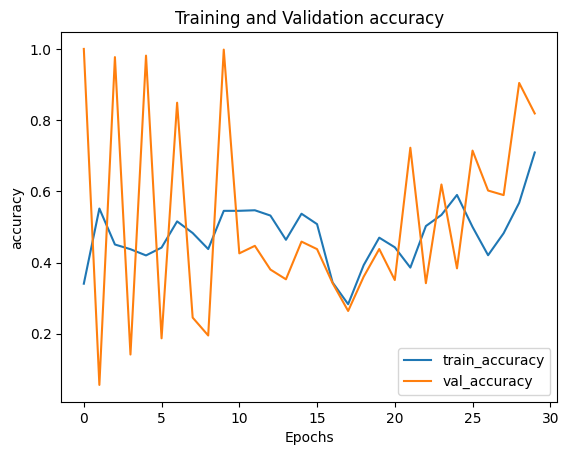

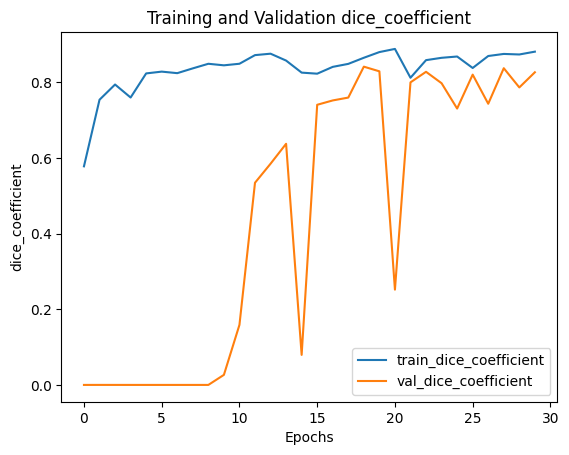

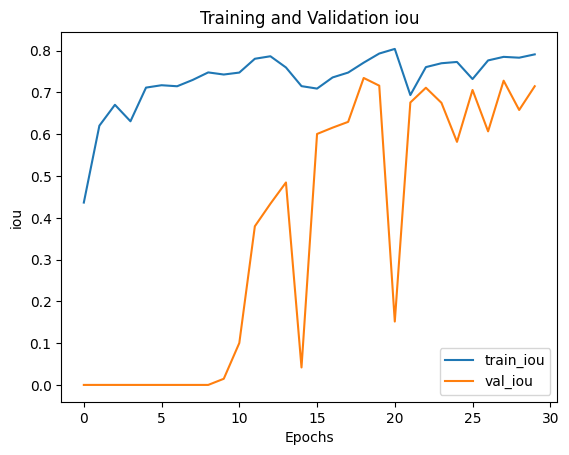

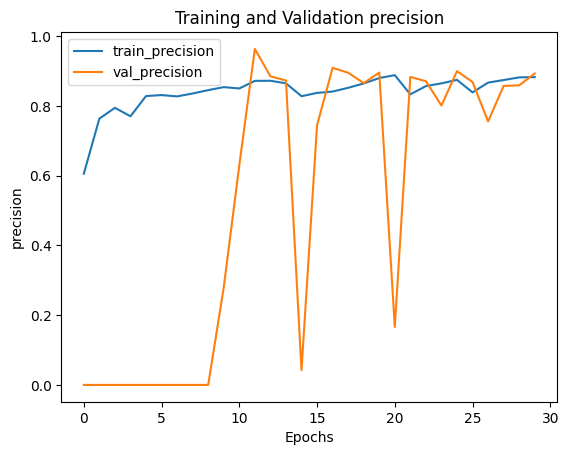

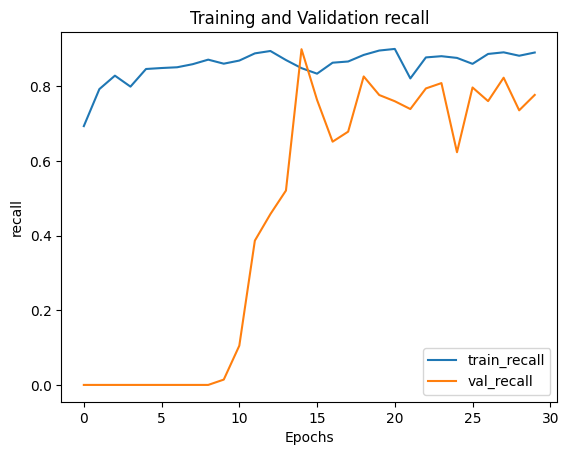

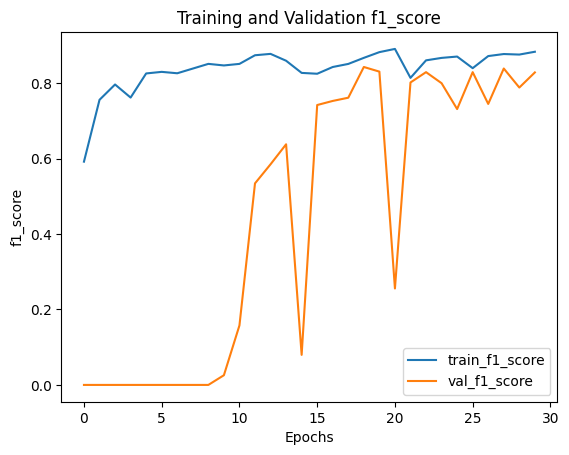

In [12]:
# Optionally, you can also plot the metrics
def plot_metrics(history):
    metrics = ['accuracy', 'dice_coefficient', 'iou', 'precision', 'recall', 'f1_score']

    for metric in metrics:
        plt.figure()
        plt.plot(history.history[metric], label='train_' + metric)
        plt.plot(history.history['val_' + metric], label='val_' + metric)
        plt.xlabel('Epochs')
        plt.ylabel(metric)
        plt.title(f'Training and Validation {metric}')
        plt.legend()
        plt.show()

plot_metrics(history)

In [13]:
save_path = '/content/sample_data/deep_dice_res.keras'

# Save the model
model.save(save_path)
